## [TGS Salt Identification Challenge](https://www.kaggle.com/c/tgs-salt-identification-challenge)

Example notebook

## Table of contents: <a name='TOC'></a>
[Changelog](#A)  
[Sources](#B)  
[About](#C)  
[U-Net model](#D)  
[Setup notebook](#E)  
[Data Exploration](#F)  
[Visualize images and masks (overlayed)](#G)  
[Train validation split](#H)  
[Custom metrics](#I)  
[Model architecture](#J)  
[Build model](#K)  
[Train model](#L)  
[Learning curves](#M)  
[Check performance on validation set](#N)  
[Scoring](#O)  
[Post-processing: blur and threshold](#Q)   
[Predict test set](#P)   
[Submission](#R)   

## Changelog <a name='A'></a>

21/aug/2018  
 - initial commit

## Sources that earn credits <a name='B'></a>
[>>TOC](#TOC)

I got initial inspiration and insights for this notebook from:  

[Alexander Liao](https://www.kaggle.com/alexanderliao/u-net-bn-aug-strat-dice/notebook)  -   Model architecture , dice loss  
[Jesper Dramsch](https://www.kaggle.com/jesperdramsch/intro-to-seismic-salt-and-how-to-geophysics)   - Seismic intro  
[Bruno G, do Amaral](https://www.kaggle.com/bguberfain/unet-with-depth)   - Depth  and cumsum  

## About
(*Jesper Dramsch*)<a name='C'></a>
[>>TOC](#TOC)

Seismic data is a neat thing. You can imagine it like an ultra-sound of the subsurface. However, in an ultra-sound, we use much smaller wavelengths to image our body. Seismic data usually has wavelengths around 1m to 100m. That has some physical implications, but for now, we don't have to deal with that. It's just something to keep in mind while thinking about resolution. 

Imaging salt has been a huge topic in the seismic industry, basically since they imaged salt the first time. The Society of Exploration geophysicist alone has over 10,000 publications with the [keyword salt](https://library.seg.org/action/doSearch?AllField=salt). Salt bodies are important for the hydrocarbon industry, as they usually form nice oil traps. So there's a clear motivation to delineate salt bodies in the subsurface. If you would like to do a deep dive, you can see [this publication](https://www.iongeo.com/content/documents/Resource%20Center/Articles/INT_Imaging_Salt_tutorial_141101.pdf)

Seismic data interpreters are used to interpreting on 2D or 3D images that have been heavily processed. The standard work of [seismic data analysis](https://wiki.seg.org/wiki/Seismic_Data_Analysis) is open access.
You'll find sections on Salt in there as well (https://wiki.seg.org/wiki/Salt-flank_reflections and https://wiki.seg.org/wiki/Salt_flanks). The seismic itself is pretty "old" in the publication, and you're dealing with data that is less noisy here, which is nice.

[![Seismic Data with salt CC-BY-SA Yilmaz](https://wiki.seg.org/images/1/14/Ch05_fig0-1.png)](https://wiki.seg.org/wiki/Salt-flank_reflections#/media/File:Ch05_fig0-1.png)
Caption: Figure 5.0-1  Conflicting dips associated with salt flanks: (a) CMP stack without dip-moveout correction; (b) time migration of the stack in (a); (c) the stack with dip-moveout correction; (d) time migration of the stack in (c). CC-BY-SA Yilmaz.

Interpretation on seismic images has long used texture attributes, to identify better and highlight areas of interest. These can be seen like feature maps on the texture of the seismic. For salt, you will notice that the texture in the salt masks is rather chaotic, where the surrounding seismic is more "striped". You can think of Earth as layered. Sand gets deposited on top of existing sand. In comes salt, which is behaving very much, unlike other rocks. There is an entire research branch dedicated to salt tectonics, that is the movement of salt in the subsurface. To give you the gist, these salt diapirs form from salt layers somewhere else that were under much pressure. These started to flow (behave ductile) and find a way into other layers above. I have written a bit about salt on [my blog](http://the-geophysicist.com/the-showroom-data-for-my-thesis).

One common seismic attribute is called "chaos" or "seismic disorder". So if you talk to cynic geophysicists, you'll hear "that deep learning better outperform the Chaos attribute". A good starting point is [this publication](http://www.chopraseismic.com/wp-content/uploads/2016/08/Chopra_Marfurt_TLE_Aug2016-LowRes.pdf).

Recently, geoscience has started to adopt deep learning, and it has seen a clear boom, particularly in imaging salt. Code for automatic seismic interpretation can be found here: 

+ https://github.com/waldeland/CNN-for-ASI
+ https://github.com/bolgebrygg/MalenoV
+ https://github.com/crild/facies_net

You will notice that these solutions load a specific SEG-Y file, which luckily we don't have to bother with. TGS provided some nice PNG files instead. However, you can glean some information from them how to approach seismic data. If you find you need some geophysical helpers, you can [import Bruges](https://github.com/agile-geoscience/bruges)


## U-Net model<a name='D'></a>
[>>TOC](#TOC)

The seismic images resemble X-rays and Ultrasound scans. The U-Net model is a CNN used for Biomedical Image Segmentation.   

Please read the paper: <a href="https://arxiv.org/pdf/1505.04597.pdf"> U-Net: Convolutional Networks for Biomedical Image Segmentation</a>) 

<a href="https://github.com/jocicmarko/ultrasound-nerve-segmentation">Another interesting read</a> from the Kaggle Ultrasound Nerve Segmentation competition.</p>

<p><img src="https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png" alt=""></p>



## Setup notebook<a name='E'></a>
[>>TOC](#TOC)

### Notebook mode

In [19]:
# Set Commit/Development mode
COMMIT = False
DEV = not COMMIT
DBG = False

### Profiling helpers

In [3]:
def mem_used():
    """Memory used"""
    import resource
    return round(resource.getrusage(resource.RUSAGE_SELF)[2] * 10/1028 / 10, 1)

def mem_fun(fun, **kwargs):
    """"""
    mem_start = mem_used()
    _ = fun(**kwargs)
    print(f'memory used by function: {(mem_used() - mem_start):.1f}mb')

nb_mem = mem_used()
f'Initial memory used by this notebook: {nb_mem}mb'

'Initial memory used by this notebook: 38653.0mb'

In [7]:
import os
import gc
import sys
import random
from memory_profiler import profile

import pandas as pd
import numpy as np
from itertools import chain
import cv2

import matplotlib.pyplot as plt
plt.style.use('seaborn-white')
import seaborn as sns
sns.set_style("white")
%matplotlib inline

from tqdm import tqdm_notebook

from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize

from sklearn.model_selection import train_test_split
import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, Concatenate, Dropout, BatchNormalization, UpSampling2D
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.optimizers import Adam, SGD, RMSprop, Adadelta
from keras.losses import binary_crossentropy
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

from keras import backend as K

Using TensorFlow backend.


### Set file locations
For convenience when working from different locations.

In [8]:
path = './input'
path_train = f'{path}/train'
path_test = f'{path}/test'
imgs_train = f'{path}/train/images'
masks_train = f'{path}/train/masks'
imgs_test = f'{path}/test/images'

### Set/initiate image constants

In [9]:
IMG_SIZE = 101   # original/raw image size
TGT_SIZE = 128   # tunable hyperparam: model/input image size {128, 256, 512} - for this 14gb RAM kernel 128 is max. size

In [10]:
# Check memory allocation needed for train/test set
def test_alloc_size(n, m, c):
    """"""
    imgs_test_alloc = list(range(n))
    for i in range(n):
        imgs_test_alloc[i] = np.ones((m, TGT_SIZE, TGT_SIZE, c)) * random.randint(0,100)
    return imgs_test_alloc
    
if DBG:
    mem_fun(test_alloc_size, n=1, m=18000, c=2)
    print(f'notebook memory used: {mem_used()}mb')
    ## memory used by function: 4482.3mb for (1800, 128, 1288, 2)
    ## notebook memory used: 4805.7mb

In [11]:
print(f'notebook memory used: {mem_used()}mb')

notebook memory used: 207660.8mb


In [12]:
# Helper functions
def upsample(img, dim=TGT_SIZE, interpolation=cv2.INTER_LINEAR):
    """Resize image to target shape(model_input) or back to original shape
    
    INTER_NEAREST - a nearest-neighbor interpolation
    INTER_LINEAR - a bilinear interpolation (used by default)
    INTER_AREA - resampling using pixel area relation. It may be a preferred method for image decimation, as it gives moire’-free results. But when the image is zoomed, it is similar to the INTER_NEAREST method.
    INTER_CUBIC - a bicubic interpolation over 4x4 pixel neighborhood
    INTER_LANCZOS4 - a Lanczos interpolation over 8x8 pixel neighborhood
    To shrink an image, it will generally look best with CV_INTER_AREA interpolation, whereas to enlarge an image, 
    it will generally look best with CV_INTER_CUBIC(slow) or CV_INTER_LINEAR(faster but still looks OK).
    """
    if img.shape[0] == dim:
        return img
    return cv2.resize(img, (dim, dim), interpolation=cv2.INTER_CUBIC)


def adaptive_gaus_thres(img, n=5, m=0):
    """Adaptive Gaussian thresholding
    cv2.threshold requires a 1 layer uint8 image"""
    img = np.array(img, dtype=np.uint8)
    return cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, n, m)


def adaptive_mean_thres(img, n=5, m=0):
    """Adaptive Mean thresholding"""
    img = np.array(img, dtype=np.uint8)
    return cv2.adaptiveThreshold(img, 1, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, n, m)


def otsu_thres(img, n=0, m=255):
    """Otsu thresholding"""
    img = np.array(img, dtype=np.uint8)
    return cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]


def gaus_thres(img, n=0, m=255):
    """Gaussian thresholding"""
    img = np.array(img, dtype=np.uint8)
    return cv2.threshold(img, n, m, cv2.ADAPTIVE_THRESH_GAUSSIAN_C)[1]


def plot_mask_thres(fn, img, n, m, cmap='seismic', title=''):
    """Plot thresholding images"""
    plt.imshow(fn(img, n, m), cmap=cmap); plt.title(title)
    plt.show();

## Data Exploration<a name='F'></a>
[>>TOC](#TOC)

Load and build train and test set.

 - contemplating to use depth as a layer, this explains the stacking in `images_d`.
 - checking depth
 - checking coverage
 - checking depth - coverage relationship
 - visualize seismic images with masks

### Load csv files

These files contain image filenames(without .png) and seismic depths of the images.  
 - train.csv - filenames of train set  
 - depths.csv - depths of all images test & train set

In [172]:
train_df_ = pd.read_csv(f'{path}/train.csv', index_col="id", usecols=[0])
depths_df_ = pd.read_csv(f'{path}/depths.csv', index_col="id") # train and test
train_df_ = train_df_.join(depths_df_)
test_df = depths_df_[~depths_df_.index.isin(train_df_.index.values)]

# Indices
train_indices = train_df_.index.values
test_indices = test_df.index.values

In [173]:
# Free up some RAM
del depths_df_
print(f'notebook memory used: {mem_used()}mb')

notebook memory used: 2544922.9mb


### Load image and mask vectors

1. check for NULL/white images and filter out if any.  
2. load all images and masks
3. augment images/masks:
  - flip all masks (coverage > 0)
4. merge original and augmented images/masks
5. sanity checks on flip and merge
6. convert dictionary to arrays
7. sanity check array shapes


In [174]:
if DEV:
    empty_imgs = {name: (
                  upsample(np.array(load_img(f'{imgs_train}/{name}.png', grayscale=True)), TGT_SIZE) / 255,
                  upsample(np.array(load_img(f'{masks_train}/{name}.png', grayscale=True)), TGT_SIZE) // 255,
                  train_df_.loc[name, 'z'])
                  for name in tqdm_notebook(train_indices) if np.sum(np.array(load_img(f'{imgs_train}/{name}.png', grayscale=True)))==0}

    print(f'number of empty/white images: {len(empty_imgs)}')

number of empty/white images: 80


In [1]:
if DEV:
    # Visual sanity check white images and corresponding white masks
    for img, tup in empty_imgs.items():
        _ = plt.imshow(tup[0], cmap="Greys")
        _ = plt.imshow(tup[1], alpha=.3, cmap="Greens")
        _ = plt.title(f'White image: {img}, depth: {tup[2]}')
        _ = plt.show();

In [176]:
# Load (non-empty) images and masks
# Keep empty images as test set also has empty images
train_set = {name: (
              upsample(np.array(load_img(f'{imgs_train}/{name}.png', grayscale=True)), TGT_SIZE) / 255,                          # image vector
              upsample(np.array(load_img(f'{masks_train}/{name}.png', grayscale=True)), TGT_SIZE) // 255,                        # mask vector
              train_df_.loc[name, 'z'],                                                                                          # depth
              np.sum(upsample(np.array(load_img(f'{masks_train}/{name}.png', grayscale=True)), TGT_SIZE) // 255) / TGT_SIZE**2,  # salt coverage
              (np.sum(upsample(np.array(load_img(f'{masks_train}/{name}.png', grayscale=True)), TGT_SIZE) // 255) / TGT_SIZE**2  # salt coverage class
                  - .01) * 100//10 + 1)
              for name in tqdm_notebook(train_indices)} # if np.sum(np.array(load_img(f'{imgs_train}/{name}.png', grayscale=True))) > 0}

n_train_samples = len(train_set.keys())
print(f'Number of training samples: {n_train_samples}')

Number of training samples: 4000


In [177]:
# Load non-empty flip images and masks
train_flip = {f'{name}_': (
              np.fliplr(upsample(np.array(load_img(f'{imgs_train}/{name}.png', grayscale=True)), TGT_SIZE) / 255),               # flipped image vector
              np.fliplr(upsample(np.array(load_img(f'{masks_train}/{name}.png', grayscale=True)), TGT_SIZE) // 255),             # flipped mask vector
              train_df_.loc[name, 'z'],                                                                                          # depth
              np.sum(upsample(np.array(load_img(f'{masks_train}/{name}.png', grayscale=True)), TGT_SIZE) // 255) / TGT_SIZE**2,  # salt coverage
              (np.sum(upsample(np.array(load_img(f'{masks_train}/{name}.png', grayscale=True)), TGT_SIZE) // 255) / TGT_SIZE**2  # salt coverage class
                  - .01) * 100//10 + 1)
              for name in tqdm_notebook(train_indices) if np.sum(np.array(load_img(f'{masks_train}/{name}.png', grayscale=True))) > 0}

n_flip_samples = len(train_flip.keys())
print(f'Number of flipped training samples: {n_flip_samples}')

Number of flipped training samples: 2438


In [178]:
# Merge train set with flips
train_dict = {**train_set, **train_flip}

# Sanity check 1 entry
if DEV:
    train_dict[list(train_dict)[1]]


(array([[0.34117647, 0.37254902, 0.36862745, ..., 0.4       , 0.43529412,
         0.47058824],
        [0.32156863, 0.36078431, 0.36470588, ..., 0.41568627, 0.45098039,
         0.47843137],
        [0.31764706, 0.37254902, 0.39215686, ..., 0.43137255, 0.45882353,
         0.46666667],
        ...,
        [0.63921569, 0.63529412, 0.61960784, ..., 0.34901961, 0.29803922,
         0.23921569],
        [0.58823529, 0.58431373, 0.56470588, ..., 0.34117647, 0.31372549,
         0.28627451],
        [0.55294118, 0.54901961, 0.52941176, ..., 0.34117647, 0.3372549 ,
         0.3372549 ]]), array([[0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1]], dtype=uint8), 794, 0.5, 5.0)

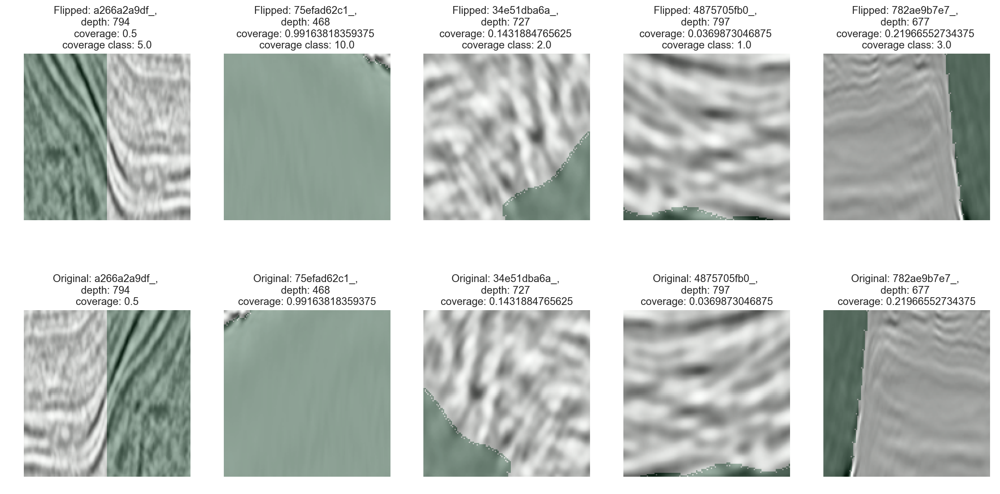

In [179]:
if DEV:
    # Visual sanity check flipped images and corresponding depths, coverages
    i, max_i = 0, 5
    fig, (ax1, ax2) = plt.subplots(2,max_i, figsize=(20,10))
    for img, tup in train_dict.items():
        if img[:-1] in list(train_dict):
            _ = ax1[i].imshow(tup[0], cmap="Greys")
            _ = ax1[i].imshow(tup[1], alpha=.3, cmap="Greens")
            _ = ax1[i].set_title(f'Flipped: {img}, \ndepth: {tup[2]} \ncoverage: {tup[3]} \ncoverage class: {tup[4]}'); 
            _ = ax1[i].axis('off')

            _ = ax2[i].imshow(train_dict[img[:-1]][0], cmap="Greys")
            _ = ax2[i].imshow(train_dict[img[:-1]][1], alpha=.3, cmap="Greens")
            _ = ax2[i].set_title(f'Original: {img}, \ndepth: {train_dict[img[:-1]][2]} \ncoverage: {train_dict[img[:-1]][3]}'); 
            _ = ax2[i].axis('off')
            i += 1
            if i==max_i: break


In [180]:
# Convert dictionary to arrays
X_train = np.array([v[0] for k, v in train_dict.items()])[...,np.newaxis]
Y_train = np.array([v[1] for k, v in train_dict.items()])[...,np.newaxis]
X_depth = np.array([v[2] for k, v in train_dict.items()])
Y_coverages = np.array([v[3] for k, v in train_dict.items()])
Y_cov_class = np.array([v[4] for k, v in train_dict.items()])

In [181]:
if DBG:
    # Sanity check array shapes
    X_train.shape, Y_train.shape, X_depth.shape, Y_coverages.shape, Y_cov_class.shape,n_train_samples, n_flip_samples

In [182]:
# Normalize depth
print('Computing normalized seismic dept...')
depth = X_depth
mean_depth, std_depth, max_depth = depth.mean(), depth.std(), depth.max()
X_norm_depth = (depth - mean_depth) / std_depth

Computing normalized seismic dept...


### Depth

 - checking the distribution
 
*As per below: depth is 'normal' distributed and train and test set have same distribution.*

/Users/frank/.virtualenvs/dl_kernel/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


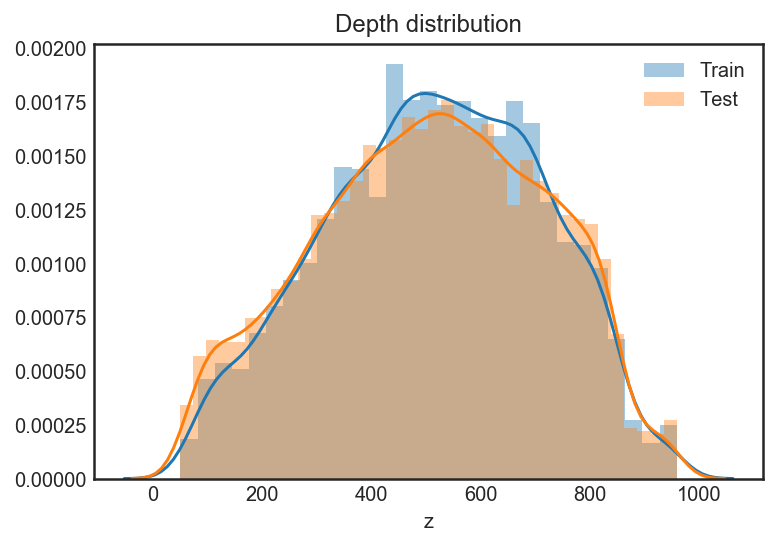

In [183]:
if DEV:
    _ = sns.distplot(X_depth, label="Train")
    _ = sns.distplot(test_df.z, label="Test")
    _ = plt.legend()
    _ = plt.title("Depth distribution")

### Depth vs. coverage

 - checking the correlation between depth and coverage
 
 Stretching and offsetting the normalized salt coverage for visual comparison reason only
 
*As per below: no pattern or correlation visible, depth and coverage are unrelated. Depth might still be a factor in the prediction, e.g. the structure/grain might relate to depth.*

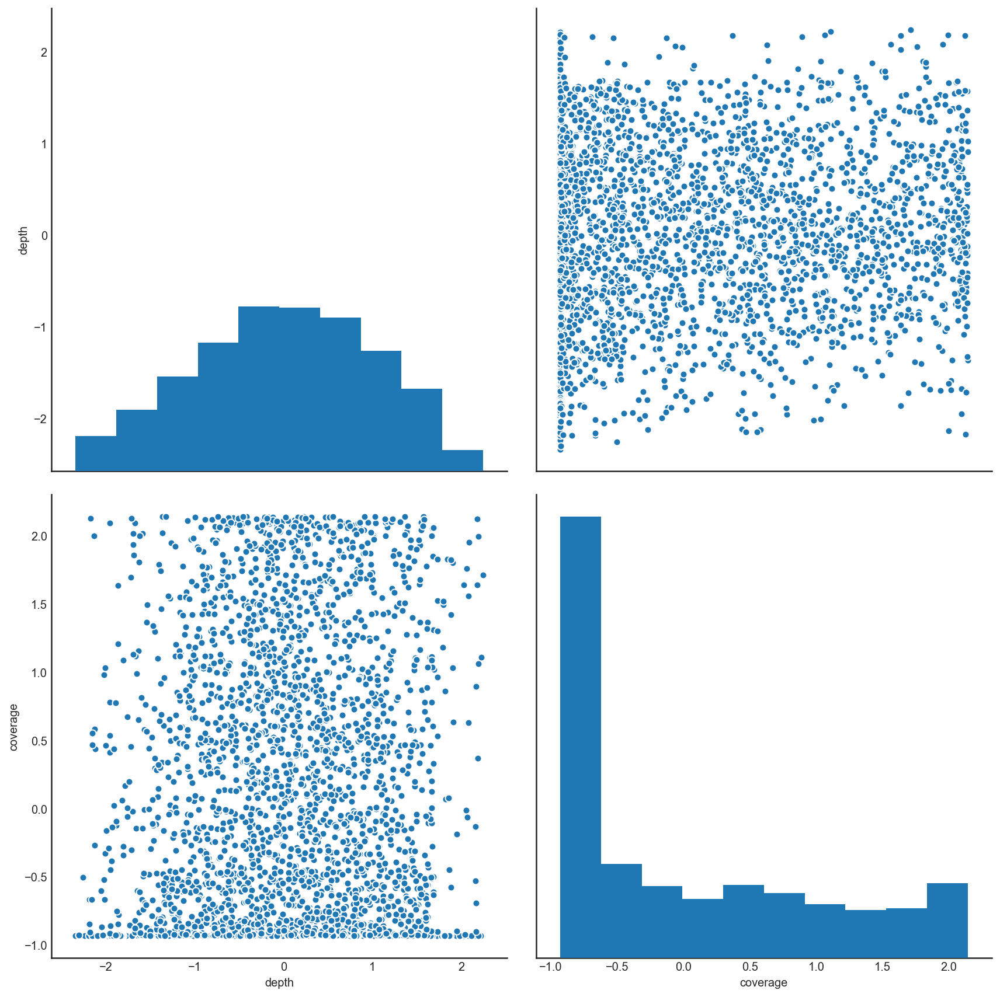

In [184]:
if DEV:
    # Pairplot
    salt_cover_norm = (Y_coverages - np.mean(Y_coverages)) / np.std(Y_coverages)
    sns.pairplot(pd.DataFrame(np.stack((X_norm_depth, salt_cover_norm)).T, columns=['depth', 'coverage']), size=6);

### Coverage class

*As per below: there are 8-10 times more seismic images with 0-10% salt areas. Stratification in train-validation split must prevent overfitting.*

/Users/frank/.virtualenvs/dl_kernel/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


[1946  892  558  450  360  470  374  336  312  300  440]


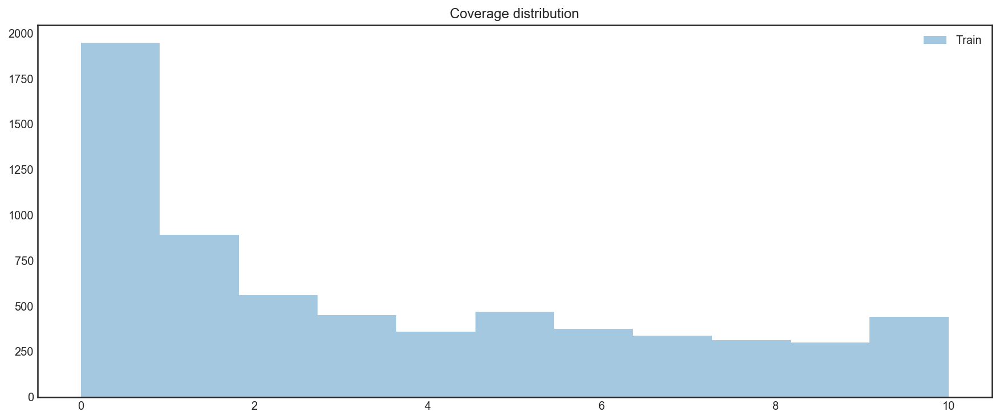

In [185]:
if DEV:
    bincount = np.bincount(list(Y_cov_class))
    _ = plt.figure(figsize=(15, 6))
    _ = sns.distplot(Y_cov_class, label="Train", kde=False, bins=len(bincount))
    _ = plt.legend()
    _ = plt.title("Coverage distribution")
    print(bincount)

## Visualize images and masks (overlayed)<a name='G'></a>
[>>TOC](#TOC)

Helper function for using throughout notebook

In [100]:
def plot_imgs_masks(imgs, masks, **kwargs):
    """Visualize seismic images with their salt area mask(green) and optionally salt area prediction(pink). 
    The prediction mask can be either in probability-mask or binary-mask form(based on threshold)
    Arguments:
    imgs: vector(-1, h, w, ch)
    masks: vector(-1, h, w, ch)
    """
    depth = kwargs.get('depth', None)
    coverage = kwargs.get('coverage', None)
    cov_class = kwargs.get('cov_class', None)
    preds_valid = kwargs.get('preds_valid', None)
    thres = kwargs.get('thres', None)
    grid_width = kwargs.get('grid_width', 10)
    zoom = kwargs.get('zoom', 1.5)
    
    grid_height = 1 + (len(imgs)-1) // grid_width
    fig, axs = plt.subplots(grid_height, grid_width, figsize=(grid_width*zoom, grid_height*zoom))
    axes = axs.ravel()
    
    for i, (img, mask) in enumerate(zip(imgs, masks)):
        
        ax = axes[i] #//grid_width, i%grid_width]
        _ = ax.imshow(img[..., 0], cmap="Greys")
        _ = ax.imshow(mask[..., 0], alpha=0.3, cmap="Greens")
        
        if preds_valid is not None:
            pred = preds_valid[i]
            pred = pred[..., 0]
            if thres is not None:
                pred = np.array(np.round(pred > thres), dtype=np.float32)
                iou = f'IoU: {IoU(mask, pred)}'
                _ = ax.imshow(pred, alpha=0.3, cmap="Oranges")
                _ = ax.text(2, img.shape[0]-2, iou, color="k")
            else:
                _ = ax.imshow(pred, alpha=0.3, cmap="Oranges")
            
        if depth is not None:
            _ = ax.text(2, img.shape[0]-2, f'depth: {depth[i].round(3)}', color="k")
        if (coverage is not None) and (cov_class is not None):   
            _ = ax.text(2, 2, f'{coverage[i].round(3)}({cov_class[i]})', color="k", ha="left", va="top")
        _ = ax.set_yticklabels([])
        _ = ax.set_xticklabels([])
        _ = plt.axis('off')
    plt.suptitle("Green: Salt area mask \nTop-left: coverage class, top-right: salt coverage, bottom-left: depth", y=1+.5/grid_height, fontsize=20)
    plt.tight_layout();

### Visualise sample - get a feel of the data

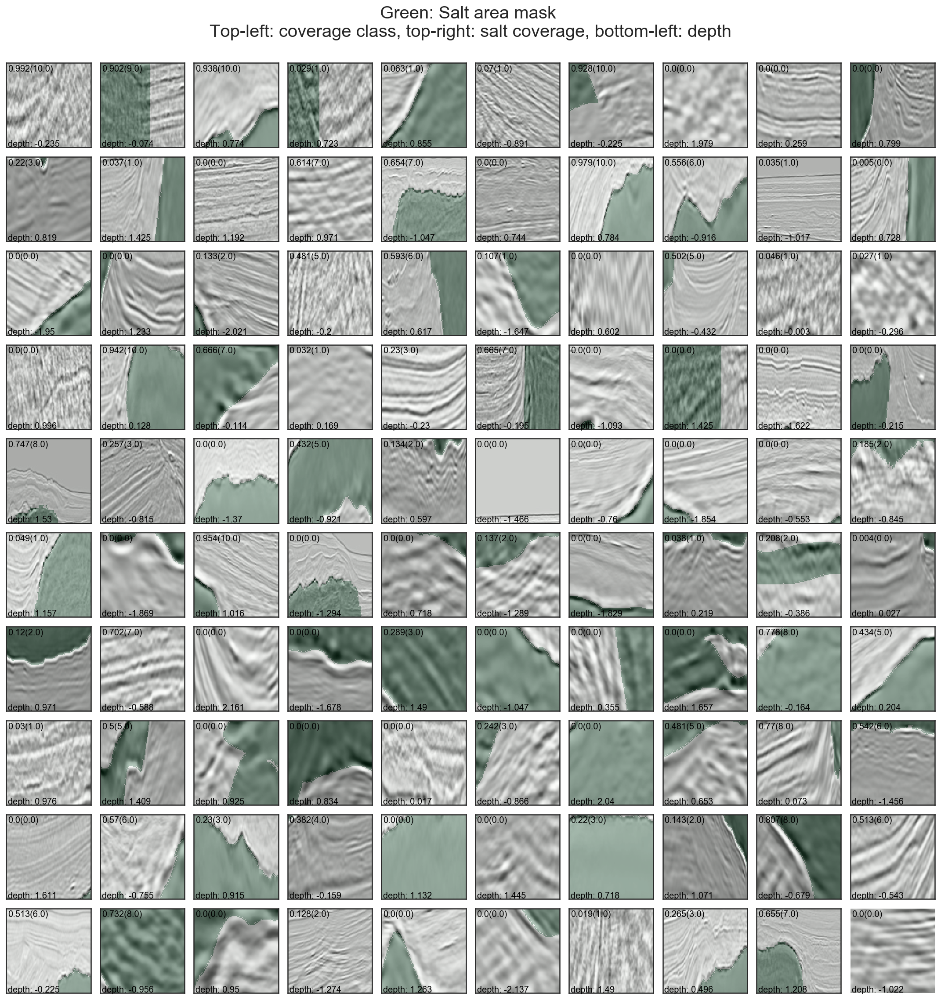

In [59]:
if DEV:
    N = 100
    sample = random.sample(list(range(N)), N)
    plot_imgs_masks(X_train[sample], Y_train[sample], coverage=Y_coverages[sample], cov_class=Y_cov_class[sample], depth=X_norm_depth[sample])

## Train validation split<a name='H'></a>
[>>TOC](#TOC)

Validation set will be used for saving model checkpoints and early stopping. 
Tradeoff:
 - larger validation set for more validation accuracy and saving better generalizing model, which means less training samples and thus less generalizing model.

Using images with depth layer.

In [188]:
VAL_SIZE = 0.1

print(f'notebook memory used before split: {mem_used()}mb')

X_train, X_valid, Y_train, Y_valid, depth_train, depth_valid = train_test_split(
    X_train,
    Y_train,
    np.array(X_norm_depth).reshape(-1, 1),
    test_size=VAL_SIZE, 
    stratify=Y_cov_class, 
    random_state=1)

gc.collect()
print(f'notebook memory used after split: {mem_used()}mb')

notebook memory used before split: 2544922.9mb


335013

notebook memory used after split: 2544922.9mb


In [34]:
# Y_valid[:20,...,0]
# Y_train[:20,...,0]
# [(np.sum(Y.ravel()==1) + np.sum(Y.ravel()==0)) == Y.shape for Y in Y_valid[...,0]]

#### Sanity check 

Shape and images/masks

In [35]:
if DBG:
    print(X_train.shape, Y_train.shape, X_valid.shape, Y_valid.shape, depth_train.shape, depth_valid.shape)

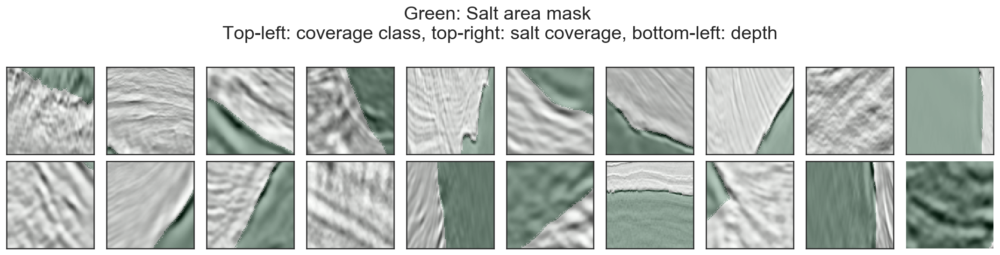

In [36]:
if DEV:
    # Sanity check X_valid, Y_valid
    N = 20
    plot_imgs_masks(X_valid[:N], Y_valid[:N])

## Custom metrics<a name='I'></a>
<div align="right">[>>TOC](#TOC)</div>

Custom metrics can be passed at the compilation step. The function would need to take (y_true, y_pred) as arguments and return a single tensor value. A metric function is similar to a loss function, except that the results from evaluating a metric are not used when training the model.



In [38]:
def mean_iou(Y_true, Y_pred, score_thres=0.5):
    """Compute mean(IoU) metric
    IoU = intersection / union
    
    For each (mask)threshold in provided range:
     - convert probability mask to boolean mask based on given threshold
     - score the mask 1 if(IoU > score_threshold(0.5))
    Take the mean of the scoress

    https://www.tensorflow.org/api_docs/python/tf/metrics/mean_iou
    """
    prec = []
    for t in np.arange(0.5, 1.0, 0.05):
        Y_pred_bool = tf.to_int32(Y_pred > t) # boolean mask by threshold
        score, update_op = tf.metrics.mean_iou(Y_true, Y_pred_bool, 2)
        
        K.get_session().run(tf.local_variables_initializer())
        with tf.control_dependencies([update_op]):
            score = tf.identity(score) #!! use identity to transform score to tensor
        prec.append(score) 
        
    return K.mean(K.stack(prec), axis=0)

def as_keras_metric(method):
    """
    https://stackoverflow.com/questions/43076609/how-to-calculate-precision-and-recall-in-keras"""
    import functools
    @functools.wraps(method)
    def wrapper(self_, args, **kwargs):
        """ Wrapper for turning tensorflow metrics into keras metrics """
        value, update_op = method(self_, args, **kwargs)
        K.get_session().run(tf.local_variables_initializer())
        with tf.control_dependencies([update_op]):
            value = tf.identity(value)
        return value
    return wrapper

precision = as_keras_metric(tf.metrics.precision)
# recall = as_keras_metric(tf.metrics.recall)

## Model architecture<a name='J'></a>
[>>TOC](#TOC)

Below functions create the UNet model in a functional and recursive way.

In [39]:
def conv_block(m, ch_dim, acti, bn, res, do=0):
    """CNN block"""
    n = Conv2D(ch_dim, 3, activation=acti, padding='same')(m)
    n = BatchNormalization()(n) if bn else n
    n = Dropout(do)(n) if do else n
    n = Conv2D(ch_dim, 3, activation=acti, padding='same')(n)
    n = BatchNormalization()(n) if bn else n
    return Concatenate()([m, n]) if res else n

def input_feature(f, n, n_features=1):
    """Input block"""
    features = 1
    xx = K.int_shape(n)[1]
    f_repeat = RepeatVector(xx*xx)(f)
    f_conv = Reshape((xx, xx, n_features))(f_repeat)
    n = Concatenate(axis=-1, name=f'feat_{2}')([n, f_conv])
    n = BatchNormalization()(n)            
    return n

In [40]:
def level_block(m, ch_dim, depth, inc_rate, acti, do, bn, mp, up, res, inp_feat):
    """Recursive CNN builder"""
    if depth > 0:
        n = conv_block(m, ch_dim, acti, bn, res) # add/remove drop-out: ,do
        m = MaxPooling2D()(n) if mp else Conv2D(ch_dim, 3, strides=2, padding='same')(n)
        if (inp_feat is not None) and (depth==2):
            m = Concatenate()([m, input_feature(inp_feat, m)])
        m = level_block(m, int(inc_rate*ch_dim), depth-1, inc_rate, acti, do, bn, mp, up, res, inp_feat)
        
        # Unwind recursive stack calls - creating the upscaling part of the model
        if up:
            # Repeat the rows and columns of the data by 2 and 2 respectively - untrainable like reverse pooling
            m = UpSampling2D()(m)
            m = Conv2D(ch_dim, 2, activation=acti, padding='same')(m)
        else:
            # Transposed convolutions are going in the opposite direction of a normal convolution - trainable
            m = Conv2DTranspose(ch_dim, 3, strides=2, activation=acti, padding='same')(m)
        n = Concatenate()([n, m])
        m = conv_block(n, ch_dim, acti, bn, res)
    else:
        # Depth == 0 - deepest conv_block
        m = conv_block(m, ch_dim, acti, bn, res, do) # add/remove drop-out: ,do
    return m

In [41]:
def UNet(img_shape, out_ch=1, start_ch=64, depth=4, inc_rate=2., activation='relu', 
        dropout=0.5, batchnorm=False, maxpool=True, upconv=False, residual=False):
    """Returns model"""
    inputs = Input(shape=img_shape, name='img')
    inp_feat = Input(shape=(1,), name='feat') # or None
    outputs = level_block(inputs, start_ch, depth, inc_rate, activation, dropout, batchnorm, maxpool, upconv, residual, inp_feat)
    outputs = Conv2D(out_ch, 1, activation='sigmoid')(outputs)
    return Model(inputs=[inputs, inp_feat], outputs=outputs)

## Build model<a name='K'></a>
[>>TOC](#TOC)

Interesting reads:  
[orginal paper](https://arxiv.org/pdf/1505.04597.pdf)  
[Upsampling2D vs. Convolution2DTranspose](#https://distill.pub/2016/deconv-checkerboard/)  
[Optimizers](http://ruder.io/optimizing-gradient-descent/)  

In [42]:
IMG_CH = X_train.shape[-1]  # layers of image
CONV_CH = 16                # number of channels to start/end UNet with
DEPTH = 4                   # number of CONV blocks to max model depth
D_OUT = 0.2                 # small random effect can be effective against overfitting. 
                            # Drop-out layers at the end of the contracting path perform further implicit data augmentation.
BN = True
UP_CONV = True              # UPSampling avoids coarse checkerboard effect in images
RES = False                 # residuals skip layers for deep networks (gradient evaporation)

model = UNet((TGT_SIZE, TGT_SIZE, IMG_CH), 
             start_ch=CONV_CH, 
             depth=DEPTH, 
             dropout=D_OUT,
             batchnorm=BN, 
             upconv=UP_CONV,
             residual=RES)

### Compile and visualize model

In [43]:
LR = 0.1
# Define optimizer
# Clip gradients to norm 1., 
optimizer = {'adam': Adam(lr=LR, beta_1=0.9, beta_2=0.9995, decay=LR/100, clipnorm=5.),
             'sgd': SGD(lr=LR, decay=LR/100, momentum=0.99, nesterov=True, clipnorm=5.),
             'rmsprop': RMSprop(lr=0.01, rho=0.9, epsilon=None, decay=0.0),
             'adadelta': Adadelta(lr=1.0, rho=0.95, epsilon=None, decay=0.0)}
opt = 'adam'

# Define loss
loss = ["binary_crossentropy", "kullback_leibler_divergence"]

# Compile model
model.compile(loss=loss[0], optimizer=optimizer[opt], metrics=["accuracy", precision, mean_iou]) #accuracy

In [44]:
model_name = f'TGS_UNet_{opt}_CH-{IMG_CH}-{CONV_CH}_D-{DEPTH}_DO-{D_OUT>0}_BN-{BN}_UP-{UP_CONV}_RES-{RES}.h5'
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                (None, 128, 128, 1)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 16) 160         img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 128, 128, 16) 64          conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 128, 128, 16) 2320        batch_normalization_1[0][0]      
__________________________________________________________________________________________________
batch_norm

## Train model<a name='L'></a>
[>>TOC](#TOC)

Model can be trained succesively

In [45]:
BATCH_SIZE = 24  # larger will have more stable learning, but needs more GPU, smaller is more stochastic in nature
EPOCHS = 50      # default EPOCHS when commit mode
fit = True       # True:fit model, False:load model

callbacks = [
    EarlyStopping(patience=5, verbose=1), # bias variance tradeof
    ReduceLROnPlateau(patience=3, min_lr=0.00001, verbose=1),
    ModelCheckpoint(model_name, monitor='val_loss', save_best_only=True, verbose=1)] # continue/save based on monitor metric

X_train_dict = {'img': X_train, 
              'feat': depth_train}

X_val_dict = {'img': X_valid, 
              'feat': depth_valid}

# Train when needed
if DEV:
    train_yn = input('train y/n?: ')
    if train_yn[0] == 'n':
        fit = False
    else:
        EPOCHS = int(input('Number of training epochs?: '))

if fit:        
    history = model.fit(X_train_dict, 
            Y_train, 
            validation_data=(X_val_dict, Y_valid),
            batch_size=BATCH_SIZE,
            epochs=EPOCHS,
            callbacks=callbacks) 

Train on 5794 samples, validate on 644 samples


In [39]:
if DEV:
    print(history.history.keys())

## Learning curves<a name='M'></a>
[>>TOC](#TOC)

1. Check the curves for errors  
2. Check the curves for roughness and convergence to tune the hyperparameters:  
 - learning rate and decay
 - batch size
 - model architecture
 - epochs and earlystopping

In [40]:
if fit:
    fig, (ax_loss, ax_acc, ax_iou) = plt.subplots(1, 3, figsize=(20,8))

    _ = ax_loss.plot(history.epoch, history.history["loss"], label="Train loss")
    _ = ax_loss.plot(history.epoch, history.history["val_loss"], label="Validation loss")
    _ = ax_loss.legend()
    _ = ax_loss.set_title('Loss')
    
    _ = ax_acc.plot(history.epoch, history.history["acc"], label="Train accuracy")
    _ = ax_acc.plot(history.epoch, history.history["val_acc"], label="Validation accuracy")
    _ = ax_acc.legend()
    _ = ax_acc.set_title('Accuracy')
    
    _ = ax_iou.plot(history.epoch, history.history["mean_iou"], label="Train IoU")
    _ = ax_iou.plot(history.epoch, history.history["val_mean_iou"], label="Validation IoU")
    _ = ax_iou.legend()
    _ = ax_iou.set_title('IoU')

## Check performance on validation set <a name='N'></a>
[>>TOC](#TOC)

In [46]:
# Load best model
model = load_model(model_name, custom_objects={'mean_iou': mean_iou, 'precision': precision})
print('model loading done.')

model loading done.


In [52]:
# Evaluate best model on validation set
if DEV:
    val_scores = model.evaluate(X_val_dict, Y_valid, verbose=1)
    print(f'model validation scores: \nval_loss: {val_scores[0]}, \nval_acc: {val_scores[1]}, \nval_precision: {val_scores[2]}, \nval_miou: {val_scores[3]}')

644/644 [==============================] - 54s 84ms/step
model validation scores: 
val_loss: 0.09442965966296492, 
val_acc: 0.9619434427770769, 
val_precision: 0.3014000537602798, 
val_miou: 0.8899931426374068


In [51]:
# Predict on validation set
preds_valid = model.predict(X_val_dict, verbose=1).reshape(-1, TGT_SIZE, TGT_SIZE)
preds_valid = preds_valid.reshape(-1, TGT_SIZE, TGT_SIZE, 1)

644/644 [==============================] - 55s 85ms/step


In [53]:
if DEV:
    print(preds_valid.shape, Y_valid.shape)

(644, 128, 128, 1) (644, 128, 128, 1)


### Visualize validation(probability masks) layed over GT masks

Grount truth: green mask
Validation: pink mask

- Green are false positives (FP)
- Pink are false negatives (FN)
- Brown are true positives (TP)
- Grey are true negatives (TN)

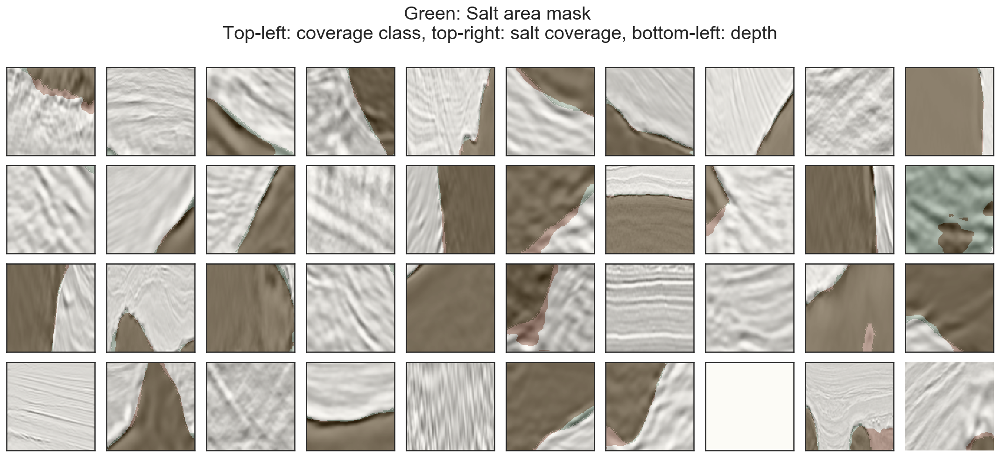

In [60]:
# Threshold = .5
if DEV:
    N = np.arange(40)
    plot_imgs_masks(X_valid[N], Y_valid[N], preds_valid=preds_valid[N]>.5)

## Post-processing: blur and threshold<a name='Q'></a>
[>>TOC](#TOC)

In [ ]:
if DEV:
    # Compare masks with different blur
    for i in random.sample(range(Y_valid.shape[0]), 5):
        y_pred = preds_valid[...,0][i]
        y = Y_valid[...,0][i]
        blurr = 7 # restricted in medianBlur - 5 is max
        thres = .7
        fig, ax = plt.subplots(1,4, figsize=(24,6))

        _ = ax[0].imshow(y>thres, cmap="seismic"); ax[0].set_title('Ground Truth mask')

        _ = ax[1].imshow(y_pred>thres, cmap="seismic"); ax[1].set_title('Prediction mask')
        _ = ax[1].imshow(y>thres, alpha=.3, cmap="Blues")

        img_blur = cv2.medianBlur(y_pred, 5)
        _ = ax[2].imshow(img_blur>thres, cmap="seismic"); ax[2].set_title('Median blur')
        _ = ax[2].imshow(y>thres, alpha=.3, cmap="Blues")

        img_blur = cv2.blur(y_pred, (blurr, blurr))
        _ = ax[3].imshow(img_blur>thres, cmap="seismic"); plt.title('Gaussian blur')
        _ = ax[3].imshow(y>thres, alpha=.3, cmap="Blues")
        _ = plt.show();

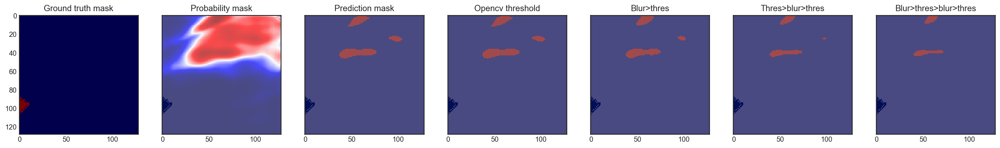

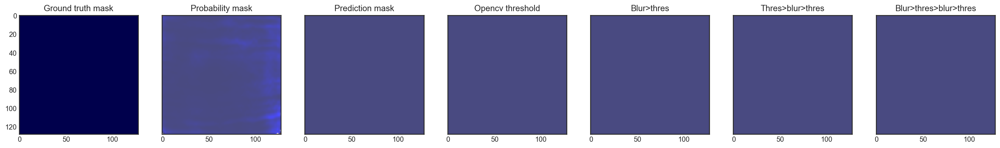

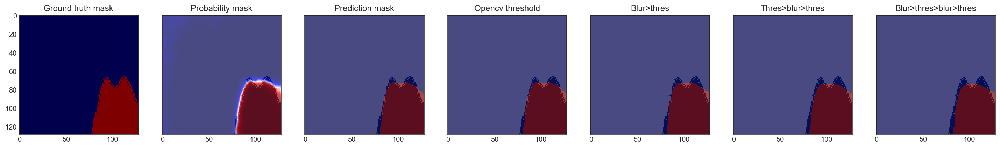

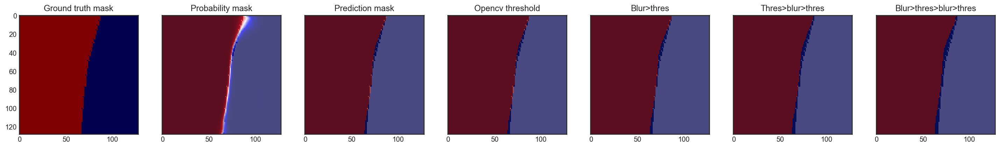

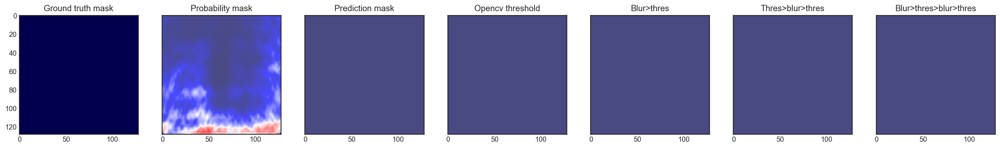

In [69]:
if DEV:
    # Combinations of blur and threshold
    sample = random.sample(range(Y_valid.shape[0]), 5)
    for i in sample:
        thres = .7
        blur_kernel = (7, 7)
        Y_pred_gaus = np.array([cv2.blur(y, blur_kernel) for y in preds_valid]).reshape(preds_valid.shape)
        
        y = Y_valid[...,0][i]
        y_pred = preds_valid[...,0][i]
        y_gaus = Y_pred_gaus[...,0][i]

        fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(1,7, figsize=(25,5), sharey=True)
        # GT mask
        _ = ax1.imshow(y, cmap="seismic"); 
        _ = ax1.set_title('Ground truth mask')

        # Probability mask
        _ = ax2.imshow(y_pred, cmap="seismic"); 
        _ = ax2.set_title('Probability mask')
        _ = ax2.imshow(y, alpha=.3, cmap="Blues")

        # Prediction mask
        img = y_pred > thres
        _ = ax3.imshow(img, cmap="seismic"); 
        _ = ax3.set_title('Prediction mask')
        _ = ax3.imshow(y, alpha=.3, cmap="Blues")

        # Opencv thresh prediction mask
        thres, img = cv2.threshold(y_pred, thres, 1, cv2.THRESH_BINARY)
        _ = ax4.imshow(img, cmap="seismic"); 
        _ = ax4.set_title('Opencv threshold')
        _ = ax4.imshow(y, alpha=.3, cmap="Blues")

        # Blur>thres prediction mask
        thres, img = cv2.threshold(y_gaus, thres, 1, cv2.THRESH_BINARY)
        _ = ax5.imshow(img, cmap="seismic"); 
        _ = ax5.set_title('Blur>thres')
        _ = ax5.imshow(y, alpha=.3, cmap="Blues")

        # Thres>blur>thres prediction mask
        thres, img = cv2.threshold(y_pred, thres, 1, cv2.THRESH_BINARY)
        img = cv2.blur(img, blur_kernel) > thres
        _ = ax6.imshow(img, cmap="seismic"); 
        _ = ax6.set_title('Thres>blur>thres')
        _ = ax6.imshow(y, alpha=.3, cmap="Blues")

        # Blur>thres>blur>thres prediction mask
        thres, img = cv2.threshold(y_gaus, thres, 1, cv2.THRESH_BINARY)
        img = cv2.blur(img, blur_kernel) > thres
        _ = ax7.imshow(img, cmap="seismic"); 
        _ = ax7.set_title('Blur>thres>blur>thres')
        _ = ax7.imshow(y, alpha=.3, cmap="Blues")
        _ = plt.show();

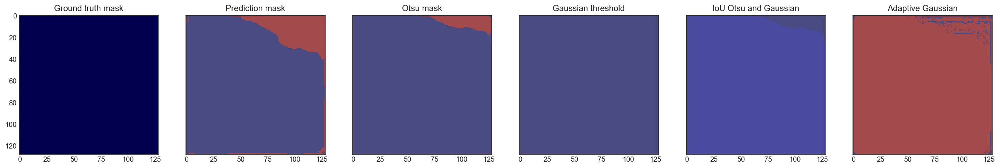

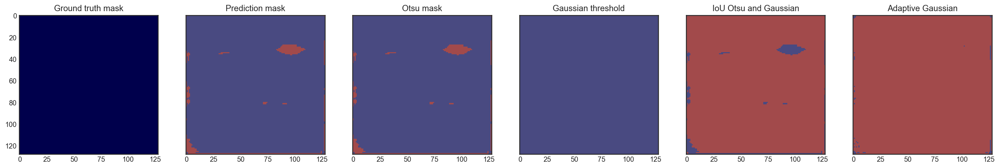

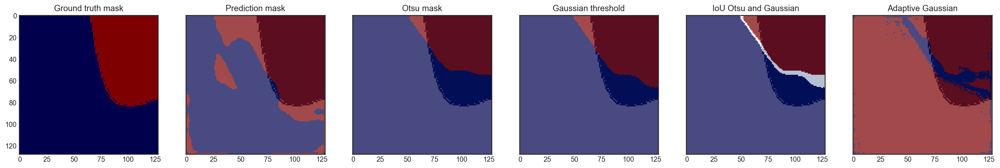

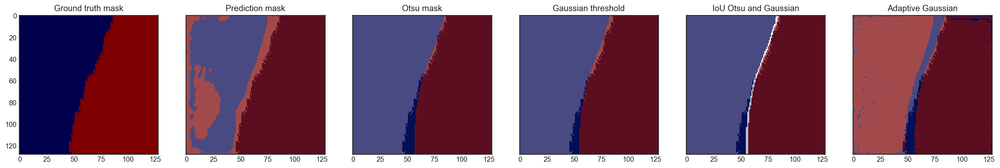

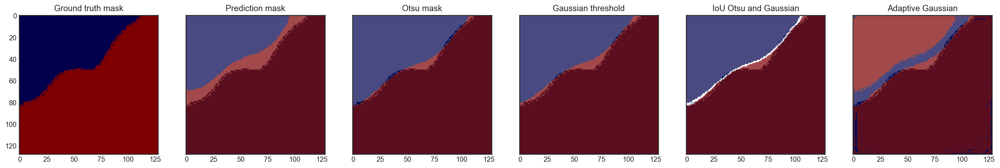

In [72]:
if DEV:
    # Experiment with special thresholding algo's
    for i in random.sample(range(Y_valid.shape[0]), 5):
        thres = .7
        blur_kernel, blurr = (3, 3), 3
        Y_pred_gaus = np.array([cv2.blur(y, blur_kernel) for y in preds_valid]).reshape(preds_valid.shape)
        
        y = Y_valid[...,0][i]
        y_pred = preds_valid[...,0][i]
        y_pred = (255 * y_pred).astype(np.uint8)
        y_gaus = Y_pred_gaus[...,0][i]

        fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1,6, figsize=(25,5), sharey=True)
        # GT mask
        _ = ax1.imshow(y, cmap="seismic"); 
        _ = ax1.set_title('Ground truth mask')
        
        # Prediction mask
        Y_ = y_pred > thres
        _ = ax2.imshow(Y_, cmap="seismic"); 
        _ = ax2.set_title('Prediction mask')
        _ = ax2.imshow(y, alpha=.3, cmap="Blues")

        # Otsu prediction mask
        _, Y_otsu = cv2.threshold(y_pred, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        _ = ax3.imshow(Y_otsu, cmap="seismic"); 
        _ = ax3.set_title('Otsu mask')
        _ = ax3.imshow(y, alpha=.3, cmap="Blues")
        
        # Adaptive threshold
        _, Y_gaus = cv2.threshold(y_pred, 60, 240, cv2.ADAPTIVE_THRESH_GAUSSIAN_C)
        _ = ax4.imshow(cv2.bitwise_not(Y_gaus), cmap="seismic"); 
        _ = ax4.set_title('Gaussian threshold')  # reverse image: cv2.bitwise_not()
        _ = ax4.imshow(y, alpha=.3, cmap="Blues")
        
        # Compbined Otsu and Adaptive
        Y_mean = (Y_otsu+Y_gaus)/2
        _ = ax5.imshow(cv2.bitwise_not(Y_mean), cmap="seismic"); 
        _ = ax5.set_title('IoU Otsu and Gaussian') 
        _ = ax5.imshow(y, alpha=.3, cmap="Blues")
        
        #
        img_thresh_Gaussian = cv2.adaptiveThreshold(y_pred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 7, 1)
        _ = ax6.imshow(img_thresh_Gaussian, cmap="seismic"); 
        _ = ax6.set_title('Adaptive Gaussian')
        _ = ax6.imshow(y, alpha=.3, cmap="Blues")

In [2]:
# Helper functions for Otsu masking
def pred_otsu(y, thresh, blurr=3):
    """Preprocess mask for otsu threshold
    Returns:
    binary mask"""
    blur_kernel = (blurr, blurr)
    try:
        im = cv2.blur(y, blur_kernel) > thresh
        im = np.array(im * 255, dtype=np.uint8)
        _, Y_otsu = cv2.threshold(im, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    except:
        Y_otsu = np.zeros_like(y)
    return Y_otsu//255

def preds_otsu(Y, threshold, blurr):
    """Preprocess masks for otsu threshold"""
    Y_otsu = [pred_otsu(y, threshold, blurr) for y in Y[...,0]]
    return np.array(Y_otsu, dtype=np.int8).reshape(Y.shape)

# Sanity check function
if DEV:
    for i in [6, 13, 17, 27]:
        thres = .7
        blurr = 3
        _ = plt.imshow(preds_otsu(preds_valid[:28], threshold=thres, blurr=blurr)[i,...,0], cmap="seismic")
        _ = plt.imshow(Y_valid[...,0][i], alpha=.3, cmap="Blues")
        _ = plt.title('Otsu'); 
        _ = plt.show();

## Scoring<a name='O'></a>
[>>TOC](#TOC)

Score the model and do a threshold optimization by the best IoU

In [80]:
def IoU(Y_true, Y_pred):
    """IoU of unary/boolean mask using confusion matrix"""
    CM, _, _ = np.histogram2d(Y_true.ravel(), Y_pred.ravel(), bins=(2,2))
    TN, FN, FP, TP = np.split(CM.ravel(), 4)
    if TP==0:
        return 0
    else:
        iou = TP / (FN + FP + TP)
    return np.mean(np.arange(0.5, 1.0, 0.05) < iou)

def miou(Y_trues, Y_preds):
    """Mean intersection over union of all masks"""
    return np.mean([IoU(Y_trues[i], Y_preds[i]) for i in range(Y_trues.shape[0])])

def best_miou(mious):
    """Returns tuple of (best IoU, corresponding threshold)"""
    best_idx = np.argmax(mious)
    return mious[best_idx], thresholds[best_idx]

### Best threshold for best IoU score (submission)

Checking which threshold delivers the best IoU score, so this threshold will be used for Test set prediction.

### Compare blur effect on IoU

In [75]:
if DEV:
    # Explore best params giving best IoU: blur kernel size, threshold
    blur_range = [1, 3, 5, 7, 9]
    mious_otsu = {}
    for i, blurr in enumerate(blur_range):
        print(f'computing best IoU @blur: {blurr}')
        thresholds = np.linspace(0.1, 0.9, 80)
        mious_otsu = {**mious_otsu, **{blurr: {threshold: miou(Y_valid, preds_otsu(preds_valid, threshold, blurr=blurr))
                     for threshold in tqdm_notebook(thresholds)}}}

computing best IoU @blur: 1


computing best IoU @blur: 3


computing best IoU @blur: 5


computing best IoU @blur: 7


computing best IoU @blur: 9


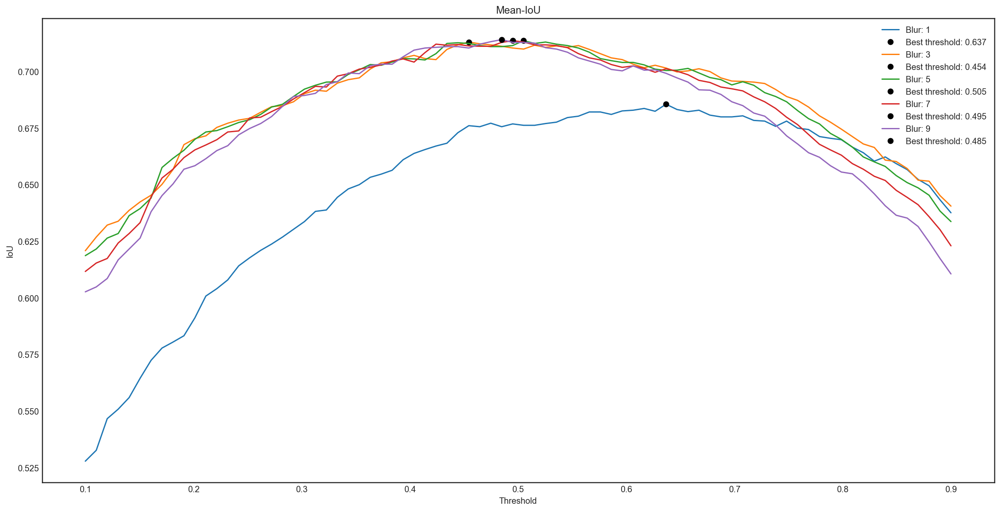

In [92]:
# 
if DEV:
    # Visualize IoU by blur and as function of thresholds
    _ = plt.figure(figsize=(20,10))
    _ = plt.xlabel("Threshold")
    _ = plt.ylabel("IoU")
    _ = plt.title(f"Mean-IoU")
    
    for i in blur_range:
        best_idx = np.argmax(list(mious_otsu[i].values()))
        threshold_best_ = list(mious_otsu[i])[best_idx]
        miou_best_ = list(mious_otsu[i].values())[best_idx]
        _ = plt.plot(list(mious_otsu[i]), mious_otsu[i].values(), label=f'Blur: {i}')
        _ = plt.plot(threshold_best_, miou_best_, "ok", label=f"Best threshold: {threshold_best_.round(3)}")
        _ = plt.legend()

In [93]:
# IoU scores for best params
# Blur 3 gives same reuslts as more blur, this is the savest bet
blurr = 3 
thresholds = np.linspace(0.1, 0.9, 80)
mious_no = np.array([miou(Y_valid, np.int8(preds_valid > threshold)) 
                 for threshold in tqdm_notebook(thresholds)])
mious_otsu = np.array([miou(Y_valid, preds_otsu(preds_valid, threshold, blurr=blurr))
                 for threshold in tqdm_notebook(thresholds)])

# Get best scores by threshold
miou_best_otsu, threshold_best_otsu = best_miou(mious_otsu)
miou_best, threshold_best = best_miou(mious_no)

<Figure size 1440x720 with 0 Axes>

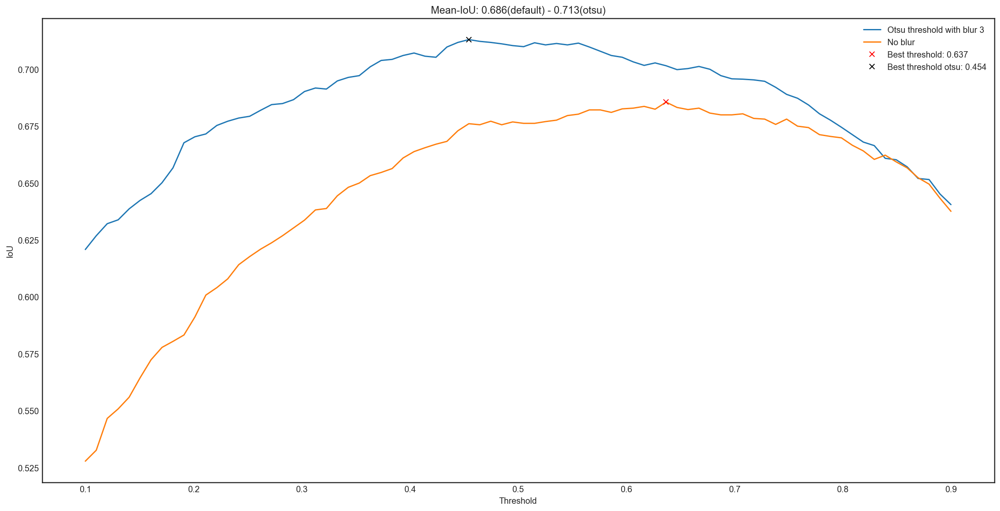

In [95]:
if DEV:
    # Visualize best IoU as function of thresholds
    plt.figure(figsize=(20,10))
    _ = plt.plot(thresholds, mious_otsu, label=f'Otsu threshold with blur {blurr}')
    _ = plt.plot(thresholds, mious_no, label='No blur')
    _ = plt.plot(threshold_best, miou_best, "xr", label=f"Best threshold: {threshold_best.round(3)}")
    _ = plt.plot(threshold_best_otsu, miou_best_otsu, "xk", label=f"Best threshold otsu: {threshold_best_otsu.round(3)}")
    _ = plt.xlabel("Threshold")
    _ = plt.ylabel("IoU")
    _ = plt.title(f"Mean-IoU: {miou_best.round(3)}(default) - {miou_best_otsu.round(3)}(otsu)")
    _ = plt.legend()

### Visualize binary masks based on best threshold

- Green are false positives (FP)
- Pink are false negatives (FN)
- Brown are true positives (TP)
- Grey are true negatives (TN)


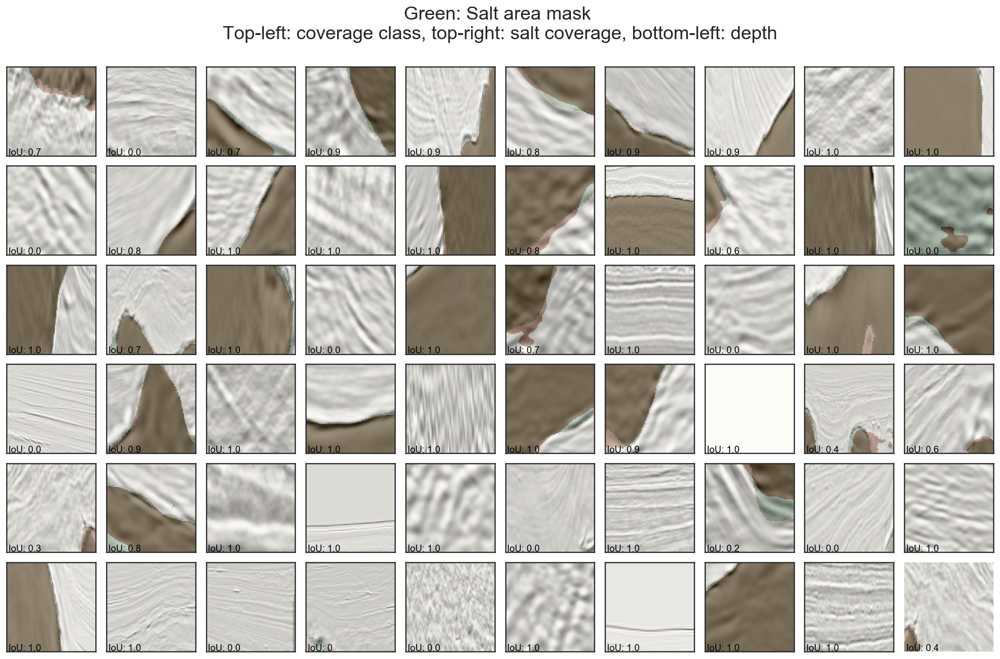

In [101]:
# Default threshold
if DEV:
    N = np.arange(60)
    plot_imgs_masks(X_valid[N], Y_valid[N], preds_valid=preds_valid[N], thres=threshold_best)

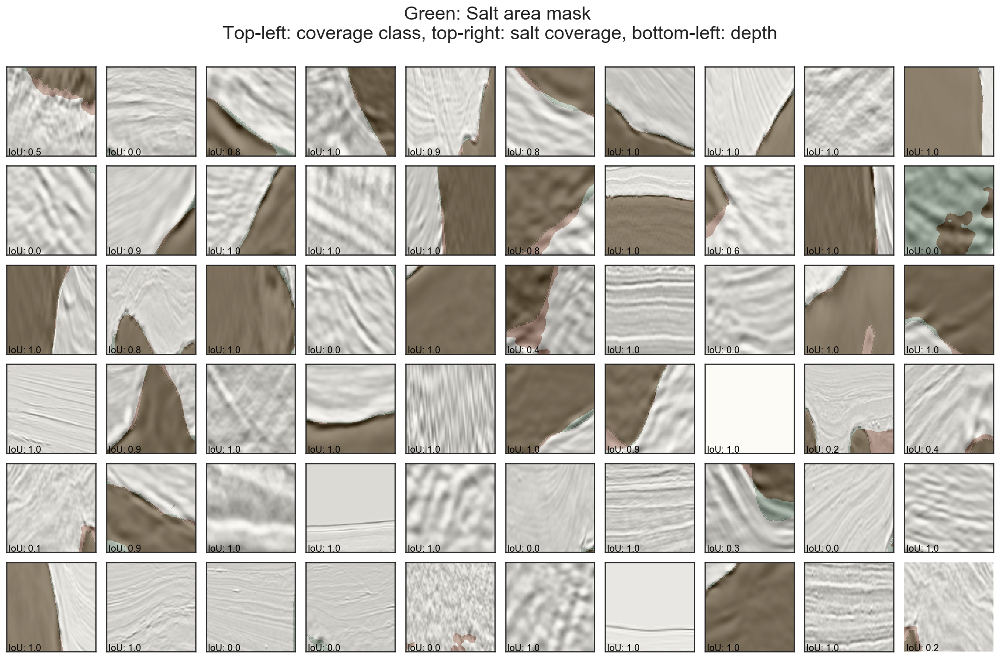

In [102]:
# Otsu threshold
if DEV:
    N = np.arange(60)
    blurr = 5
    thres = .5
    plot_imgs_masks(X_valid[N], Y_valid[N], preds_valid=preds_otsu(preds_valid, threshold_best_otsu, blurr=blurr)[N], thres=threshold_best_otsu)

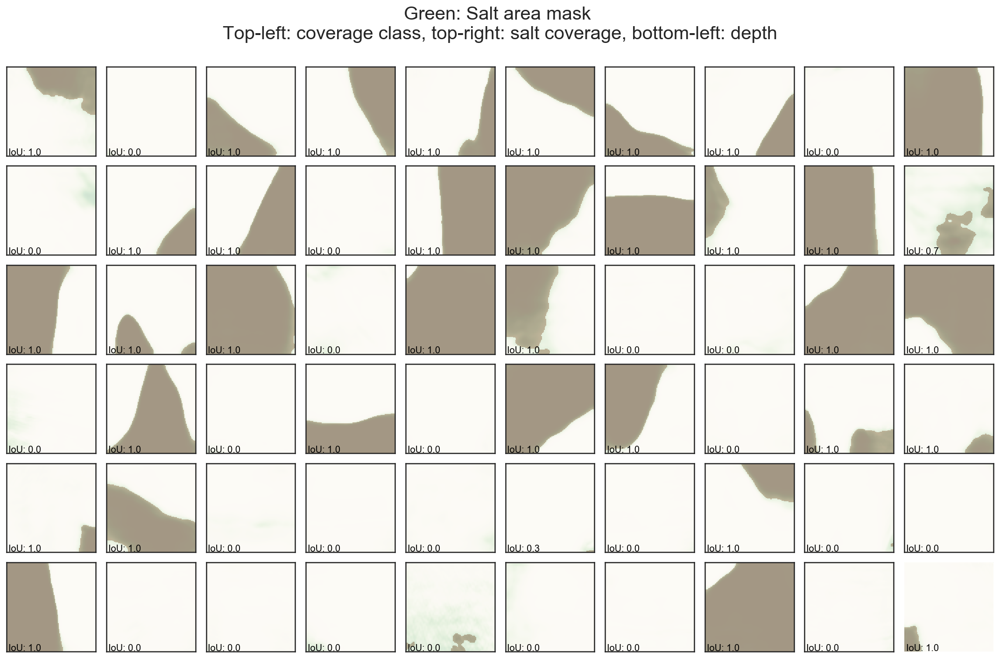

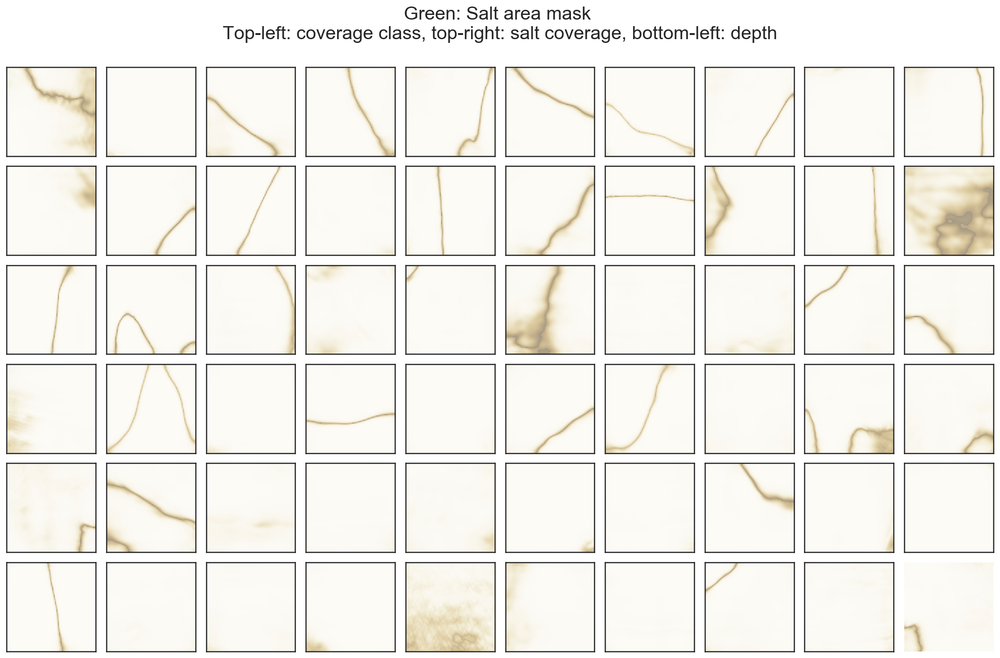

In [104]:
# Visualize effect of using Otsu threshold
if DEV:
    N = np.arange(60)
    blurr = 5

    Y_pred_non = np.array([y for y in preds_valid[N]]).reshape(preds_valid[N].shape)
    Y_pred_otsu = preds_otsu(preds_valid, threshold_best_otsu, blurr=blurr)[N]

    plot_imgs_masks((np.zeros_like(Y_pred_non)), Y_pred_non, preds_valid=Y_pred_otsu, thres=threshold_best_otsu)
    diff = abs(Y_pred_non - Y_pred_otsu) - np.ones_like(Y_pred_non)
    plot_imgs_masks((np.zeros_like(Y_pred_non)), diff, preds_valid=diff)

In [105]:
# Free up memory: need ~7gb for test set
gc.collect()
print(f'notebook memory used: {mem_used()}mb')

209059

notebook memory used: 1607476.8mb


In [3]:
# Free up memory - delete abundant objects
abundant_objects = [train_set, train_flip, train_dict, X_train, Y_train, X_valid, Y_valid]
for obj in abundant_objects:
    try:
        del obj
        gc.collect()
    except:
        print(f"couldn't delete {str(obj)}")

gc.collect()
print(f'notebook memory used: {mem_used()}mb')

***

## Predict test set<a name='P'></a>
[>>TOC](#TOC)

### Sanity check if all indices and images match

In [6]:
if DEV:
    test_ids = next(os.walk(f"{path_test}/images"))[2]
    print(set(test_ids) ^ set(test_df.index+'.png'))
    assert len(set(test_ids) ^ set(test_df.index+'.png')) == 0

### Convert test set images and depths to layers

 - Upsample images to arrays
 - Reshape for modeling
 - Create depth layer

In [109]:
# Load test set empty images
if DEV:
    test_dict_empty = {name: (
                  upsample(np.array(load_img(f'{imgs_test}/{name}.png', grayscale=True)), TGT_SIZE) / 255,              # image vector
                  test_df.loc[name, 'z'])                                                                               # depth
                  for name in tqdm_notebook(test_indices) if np.sum(np.array(load_img(f'{imgs_test}/{name}.png', grayscale=True))) == 0}

    # Convert dictionary to arrays
    X_test_empty = np.array([v[0] for k, v in test_dict_empty.items()])[...,np.newaxis]

    # Normalize depth - !use train mean and std
    X_test_depth_empty = np.array([v[1] for k, v in test_dict_empty.items()])
    X_test_norm_depth_empty = (X_test_depth_empty - mean_depth) / std_depth

    # Predict empty test set as sanity check - improve score with 1/97,6%
    X_test_dict_empty = {'img': X_test_empty, 
                         'feat': X_test_norm_depth_empty} 

    Y_test_empty = model.predict(X_test_dict_empty)
    Y_test_empty_otsu = preds_otsu(Y_test_empty, threshold_best_otsu, 3) # TODO

In [4]:
# Visual sanity check - empty images
if DEV:
    N = np.arange(30)
    plot_imgs_masks(X_test_empty[N], np.zeros_like(X_test_empty[N]), preds_valid=Y_test_empty[N], thres=threshold_best)
    plot_imgs_masks(X_test_empty[N], np.zeros_like(X_test_empty[N]), preds_valid=Y_test_empty_otsu[N], thres=threshold_best_otsu)

In [111]:
# Load test set (keep >5gb free RAM!)
# Test set has 17570/18000 = 97,6% non-empty images
X_test = np.array([upsample(np.array(load_img(f'{imgs_test}/{name}.png', grayscale=True)), TGT_SIZE) / 255  # image vector
              for name in tqdm_notebook(test_indices)])[...,np.newaxis]

X_test_depth = np.array([test_df.loc[name, 'z'] for name in tqdm_notebook(test_indices)])

# Normalize depth - !use train mean and std
X_test_norm_depth = (X_test_depth - mean_depth) / std_depth

In [112]:
# Predict X_test
X_test_dict = {'img': X_test, 
               'feat': X_test_norm_depth}

Y_test = model.predict(X_test_dict) # probability
Y_test_otsu = preds_otsu(Y_test, threshold_best_otsu, 3) # is already unary/boolean!
print('prediction done.')

prediction done.


### Visually check of predictions

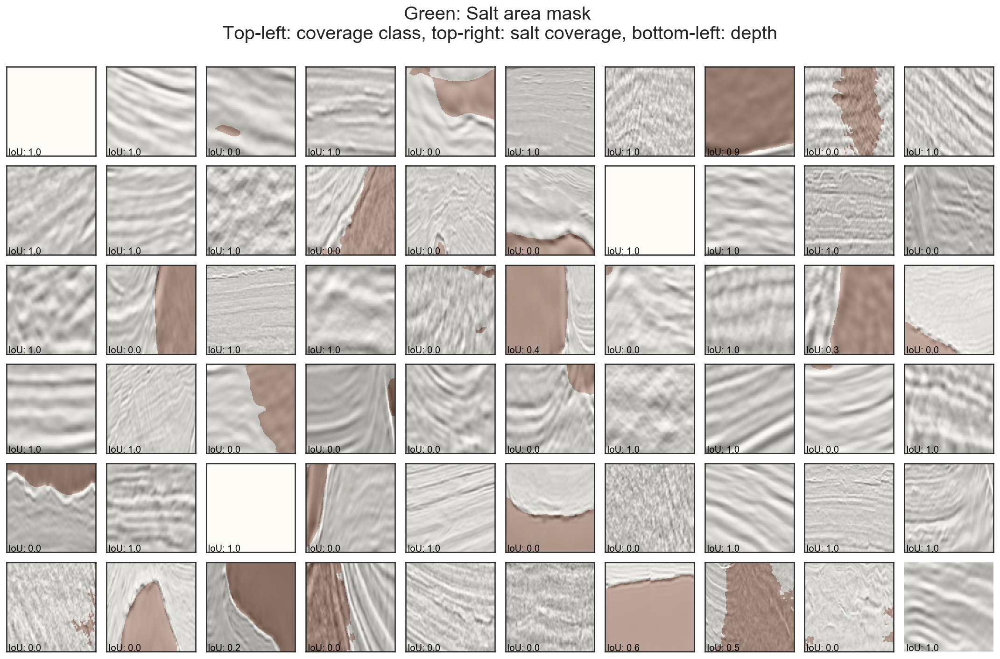

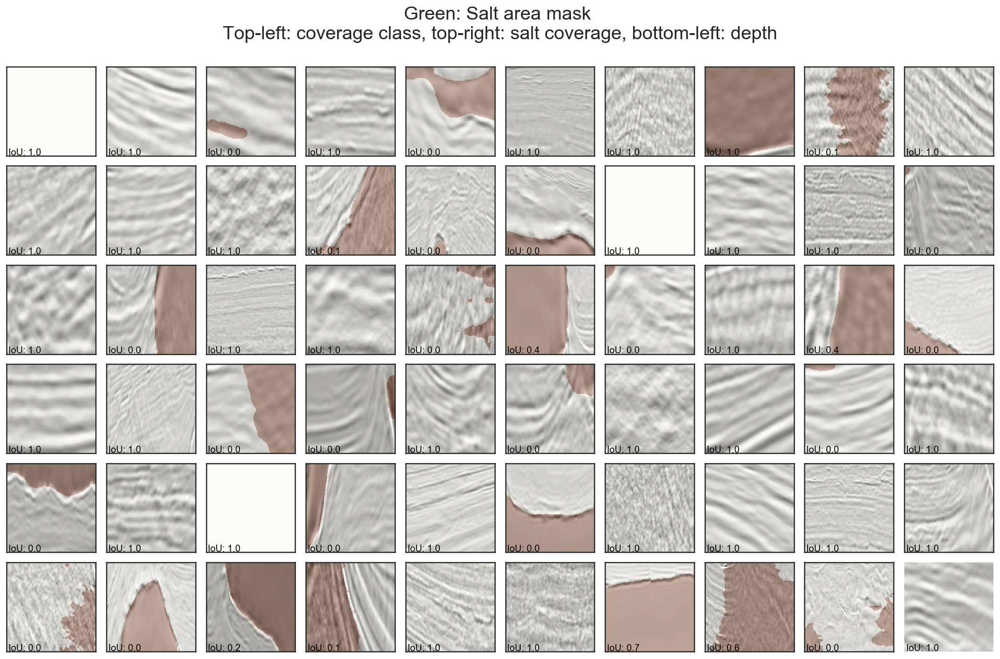

In [113]:
# Visual check of predictions without/with applying Otsu threshold
if DEV:
    N = np.arange(60)
    plot_imgs_masks(X_test[N], np.zeros_like(X_test[N]), preds_valid=Y_test[N], thres=threshold_best)
    plot_imgs_masks(X_test[N], np.zeros_like(X_test[N]), preds_valid=Y_test_otsu[N], thres=threshold_best_otsu)

## Submission  <a name='R'></a> 
[>>TOC](#TOC)

Submission is in csv form:
 - `id`: index (equals filename)
 - `rle_mask`: run-length format (down-then-right): `masked_pixel_start` `<space>` `length_of_masked_pixels` ...

In [114]:
def RLenc(img, order='F'):
    """Convert binary mask image to run-length array or string.
    
    Args:
    img: image in shape [n, m]
    order: is down-then-right, i.e. Fortran(F)
    string: return in string or array

    Return:
    run-length as a string: <start[1s] length[1s] ... ...>
    """
    bytez = img.reshape(img.shape[0]*img.shape[1], order=order)
    bytez = np.concatenate([[0], bytez, [0]])
    runs = np.where(bytez[1:] != bytez[:-1])[0] + 1 # pos start at 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

# Use for sanity check the encode function
def RLdec(rl_string, shape=(101, 101), order='F'):
    """Convert run-length string to binary mask image.
    
    Args:
    rl_string: 
    shape: target shape of array
    order: decode order is down-then-right, i.e. Fortran(F)

    Return:
    binary mask image as array
    """
    s = rl_string.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape, order=order)

In [148]:
def downsample(img, dim=101):
    """Downsize an image"""
    return cv2.resize(img, (dim, dim), interpolation=cv2.INTER_NEAREST)

In [167]:
# Encode predictions on Otsu validation threshold - upsample doesnot work (??)
pred_dict = {idx: RLenc(downsample(Y_test_otsu[i], dim=101))
             for i, idx in enumerate(tqdm_notebook(test_indices))}

In [168]:
if DEV:
    pd.DataFrame.from_dict(pred_dict, orient='index').sample(10)

,0
7a14038cdc,
2340ad8cfb,23 79 124 79 225 79 326 79 428 78 529 78 630 7...
97ac7d5eee,1 3130 3132 92 3233 89 3334 86 3435 82 3536 80...
5b5b4e2805,
5202cbe424,47 55 148 55 249 55 349 56 450 56 551 56 652 5...
13723d4e2a,69 33 170 33 271 33 372 33 473 33 574 33 675 3...
2ce0ef6162,2588 7 2608 19 2672 56 2761 68 2854 76 2939 7263
5186f6e1b4,1413 2 1512 4 1608 9 1707 11 1807 12 1906 14 2...
a089728353,
cdaa28bbd0,1 5049 5051 99 5152 98 5253 97 5354 94 5455 94...


### Save submission

In [169]:
sub = pd.DataFrame.from_dict(pred_dict, orient='index')
sub.index.names = ['id']
sub.columns = ['rle_mask']
sub.to_csv('submission.csv')

if DEV:
    sub.sample(10)
    print('submission saved!')

,rle_mask
id,
c09b502837,
a6355cc103,3940 11 4041 14 4142 18 4243 33 4344 42 4445 4...
159ff83d6d,5960 11 6061 17 6162 21 6263 23 6364 27 6465 3...
f6a757cbf6,1 21 102 21 203 20 304 20 405 20 506 20 607 19...
834c1f2d71,12 6 23 29 113 7 125 27 215 8 229 24 321 5 331...


submission saved!


[>>TOC](#TOC)